In [1]:
# importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor

warnings.filterwarnings('ignore')

loading datasets

In [2]:
table1=pd.read_csv(r'Hotel_data1 on booking.com.csv')
table1

,S.no,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings
0,0,Motel One Manchester-St. Peter´s Square,Manchester,1 Dickinson Street,"8,280",Fabulous,8.9,3.0
1,1,Motel One Manchester-Royal Exchange,Manchester,15 CROSS STREET,"11,051",Fabulous,8.6,3.0
2,2,Britannia Hotel City Centre Manchester,Manchester,35 Portland Street,"21,367",Passable,5.7,3.0
3,3,Leonardo Hotel Manchester Piccadilly,Manchester,260 Great Ancoats Street,"7,156",Very good,8.5,4.0
4,4,Sachas Hotel Manchester,Manchester,Tib Street,"12,620",Passable,5.7,3.0
...,...,...,...,...,...,...,...,...
5048,995,Flagship Sp Residency Near Sarita Vihar Metro ...,New Delhi,.,79,Poor,3.9,3.0
5049,996,Hotel Kabir Palace,New Delhi,2344 Faiz road karol Bagh Near Jhandewalan metro,12,Disappointing,4.2,3.0
5050,997,Hotel IN Hargobind Anand Vihar Couple Friendly,New Delhi,130,173,Very good,8.4,NaN
5051,998,OYO The Olive Inn,New Delhi,Plot No. 7A-10,-,-,-,3.0


In [3]:
table2=pd.read_csv(r'Hotel_data2 on booking.com.csv')
table2

,S.no,Hotel_name,Non_smoking_rooms,Restaurant,Freewifi,Lift,Heating,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Bar_x,Bar_y
0,0,Motel One Manchester-St. Peter´s Square,YES,NaN,YES,NaN,YES,NaN,NaN,Continental,-,-,NaN,NaN
1,1,Motel One Manchester-Royal Exchange,YES,NaN,YES,YES,YES,NaN,NaN,Continental,-,-,NaN,NaN
2,2,Britannia Hotel City Centre Manchester,YES,NaN,NaN,NaN,YES,YES,NaN,Continental,-,-,NaN,NaN
3,3,Leonardo Hotel Manchester Piccadilly,YES,YES,YES,YES,YES,YES,NaN,Full English/Irish,-,-,NaN,NaN
4,4,Sachas Hotel Manchester,YES,NaN,NaN,NaN,YES,YES,NaN,Full English/Irish,-,-,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5048,5944,Wood Castle Grand,NaN,NaN,NaN,NaN,NaN,NaN,YES,NaN,NaN,NaN,NaN,NaN
5049,5945,Hotel D'PRESIDENTE,NaN,NaN,NaN,NaN,NaN,NaN,YES,NaN,NaN,NaN,NaN,NaN
5050,5946,The Eden Hotel,NaN,NaN,NaN,NaN,NaN,NaN,YES,NaN,NaN,NaN,NaN,NaN
5051,5947,Indira International Inn,NaN,NaN,NaN,NaN,NaN,NaN,YES,NaN,NaN,NaN,NaN,NaN


In [4]:
table3=pd.read_csv(r'Hotel_name03 on booking.com.csv')
table3

,Unnamed: 0,Hotel_name,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,0,Sachas Hotel Manchester,Superior Double Room,single bedroom,"18,171",NaN,NaN
1,2,Britannia Hotel City Centre Manchester,Superior Suite,single bedroom,"18,171",NaN,NaN
2,4,Residence Inn by Marriott Manchester Piccadilly,King Studio with Sofa Bed,single bedroom,"24,972",NaN,NaN
3,6,Manchester Piccadilly Hotel,Junior King Suite with Panoramic City View,single bedroom,"27,307",NaN,NaN
4,8,Malmaison Manchester,Junior Suite,single bedroom,"34,027",NaN,NaN
...,...,...,...,...,...,...,...
2004,368,Golden Star Hotel,NaN,NaN,"10,611",Superior King Suite with City View,Double bedroom
2005,369,"Mercure Gold Hotel, Jumeirah, Dubai",NaN,NaN,"17,563","Premier One-Bedroom King Suite with Kitchen, B...",Double bedroom
2006,370,Al Khoory Atrium,NaN,NaN,"24,557","Superior Queen Room, City View, 25% off Spa",Double bedroom
2007,371,Royal Falcon Hotel,NaN,NaN,"4,374","1 Bedroom Queen Family Suite, Skyline View, 25...",Double bedroom


In [5]:
table1=table1.drop('S.no',axis=1)
table2=table2.drop('S.no',axis=1)
table3=table3.drop('Unnamed: 0',axis=1)


In [6]:
dfs=[table1,table2,table3]

In [7]:
dff=pd.concat([table1,table2,table3])
dff

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Bar_x,Bar_y,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,Motel One Manchester-St. Peter´s Square,Manchester,1 Dickinson Street,"8,280",Fabulous,8.9,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Motel One Manchester-Royal Exchange,Manchester,15 CROSS STREET,"11,051",Fabulous,8.6,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Britannia Hotel City Centre Manchester,Manchester,35 Portland Street,"21,367",Passable,5.7,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Leonardo Hotel Manchester Piccadilly,Manchester,260 Great Ancoats Street,"7,156",Very good,8.5,4.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sachas Hotel Manchester,Manchester,Tib Street,"12,620",Passable,5.7,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,Golden Star Hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"10,611",Superior King Suite with City View,Double bedroom
2005,"Mercure Gold Hotel, Jumeirah, Dubai",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"17,563","Premier One-Bedroom King Suite with Kitchen, B...",Double bedroom
2006,Al Khoory Atrium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"24,557","Superior Queen Room, City View, 25% off Spa",Double bedroom
2007,Royal Falcon Hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"4,374","1 Bedroom Queen Family Suite, Skyline View, 25...",Double bedroom


In [8]:
dff1=dff.drop_duplicates()
dff1

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Bar_x,Bar_y,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,Motel One Manchester-St. Peter´s Square,Manchester,1 Dickinson Street,"8,280",Fabulous,8.9,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Motel One Manchester-Royal Exchange,Manchester,15 CROSS STREET,"11,051",Fabulous,8.6,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Britannia Hotel City Centre Manchester,Manchester,35 Portland Street,"21,367",Passable,5.7,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Leonardo Hotel Manchester Piccadilly,Manchester,260 Great Ancoats Street,"7,156",Very good,8.5,4.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sachas Hotel Manchester,Manchester,Tib Street,"12,620",Passable,5.7,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2004,Golden Star Hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"10,611",Superior King Suite with City View,Double bedroom
2005,"Mercure Gold Hotel, Jumeirah, Dubai",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"17,563","Premier One-Bedroom King Suite with Kitchen, B...",Double bedroom
2006,Al Khoory Atrium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"24,557","Superior Queen Room, City View, 25% off Spa",Double bedroom
2007,Royal Falcon Hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"4,374","1 Bedroom Queen Family Suite, Skyline View, 25...",Double bedroom


In [9]:
from functools import reduce
df1=reduce(lambda left,right: pd.merge(left,right, on=['Hotel_name'], how='outer'), [table1,table2,table3])
df1


,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Bar_x,Bar_y,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,Motel One Manchester-St. Peter´s Square,Manchester,1 Dickinson Street,"8,280",Fabulous,8.9,3.0,YES,NaN,YES,...,Continental,-,-,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Motel One Manchester-Royal Exchange,Manchester,15 CROSS STREET,"11,051",Fabulous,8.6,3.0,YES,NaN,YES,...,Continental,-,-,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Britannia Hotel City Centre Manchester,Manchester,35 Portland Street,"21,367",Passable,5.7,3.0,YES,NaN,NaN,...,Continental,-,-,NaN,NaN,Superior Suite,single bedroom,"18,171",NaN,NaN
3,Leonardo Hotel Manchester Piccadilly,Manchester,260 Great Ancoats Street,"7,156",Very good,8.5,4.0,YES,YES,YES,...,Full English/Irish,-,-,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sachas Hotel Manchester,Manchester,Tib Street,"12,620",Passable,5.7,3.0,YES,NaN,NaN,...,Full English/Irish,-,-,NaN,NaN,Superior Double Room,single bedroom,"18,171",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6057,Grand Hyatt Dubai,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,One-Bedroom Grand Suite with Garden View,single bedroom,"66,319",NaN,NaN
6058,Grand Hyatt Dubai,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"103,957",Deluxe Studio Sea View with Private Beach Access,Double bedroom
6059,The Address Dubai Marina,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,One-Bedroom Apartment,single bedroom,"23,694",NaN,NaN
6060,Armada Avenue Hotel - formerly Armada BlueBay ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"6,657",Deluxe Double or Twin Room,Double bedroom


In [10]:
import functools as ft
dfft=ft.reduce(lambda left, right: pd.merge(left,right,on='Hotel_name'),dfs)
dfft

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Bar_x,Bar_y,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,Britannia Hotel City Centre Manchester,Manchester,35 Portland Street,"21,367",Passable,5.7,3.0,YES,NaN,NaN,...,Continental,-,-,NaN,NaN,Superior Suite,single bedroom,"18,171",NaN,NaN
1,Sachas Hotel Manchester,Manchester,Tib Street,"12,620",Passable,5.7,3.0,YES,NaN,NaN,...,Full English/Irish,-,-,NaN,NaN,Superior Double Room,single bedroom,"18,171",NaN,NaN
2,"Kimpton Clocktower, an IHG Hotel",Manchester,Oxford Street,"4,927",Fabulous,8.9,5.0,YES,YES,YES,...,Continental,-,-,NaN,NaN,1 King Bed Suite,single bedroom,"54,309",NaN,NaN
3,"Hotel Indigo Manchester - Victoria Station, an...",Manchester,Todd Street,"5,719",Fabulous,8.9,4.0,YES,YES,YES,...,Continental,Local • International,-,NaN,NaN,King Suite with Lounge,single bedroom,"41,113",NaN,NaN
4,Residence Inn by Marriott Manchester Piccadilly,Manchester,40 Laystall Street,463,Very good,8.5,4.0,YES,NaN,YES,...,Continental,-,-,NaN,NaN,King Studio with Sofa Bed,single bedroom,"24,972",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1854,"Rockland Hotel, C.R Park",New Delhi,B-207,-,-,-,4.0,NaN,NaN,YES,...,NaN,NaN,NaN,NaN,NaN,Deluxe Suite,single bedroom,"8,009",NaN,NaN
1855,"Rockland Hotel, C.R Park",New Delhi,B-207,-,-,-,4.0,NaN,NaN,YES,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"13,678",Junior Suite,Double bedroom
1856,FabHotel Star Delhi Airport,New Delhi,A-288,5,Very good,8.0,3.0,NaN,NaN,YES,...,NaN,NaN,NaN,NaN,NaN,Suite,single bedroom,"5,748",NaN,NaN
1857,FabHotel Star Delhi Airport,New Delhi,A-288,5,Very good,8.0,3.0,NaN,NaN,YES,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"9,825",Studio,Double bedroom


here i am considering merge method and using df1 as my dataset.

# Exploratory Data Analysis(EDA)

In [11]:
#finding the shape of the dataset
df1.shape

(6062, 24)

In [12]:
#checking the null values
df1.isna().sum()

Hotel_name              0
Cities                612
Location              612
No_of_reviews         614
Reviewscore           614
User_ratings          614
Star_ratings         1204
Non_smoking_rooms    2491
Restaurant           4173
Freewifi             1040
Lift                 3590
Heating              4490
Family_rooms         2950
Bar                  4817
Breakfast_cusine1    1758
Breakfast_cusine2    1659
Breakfast_cusine     1659
Bar_x                5866
Bar_y                6014
Room type_x          4568
single_bed           4568
Prices               3967
Room type_y          5363
Double_bed           5363
dtype: int64

In [13]:
df1=df1.drop(['Bar_x','Bar_y'],axis=1)

here max rows are hving null values so i am droping those columns

In [14]:
df1.fillna(0,inplace=True)

In [15]:
df1.isna().sum()

Hotel_name           0
Cities               0
Location             0
No_of_reviews        0
Reviewscore          0
User_ratings         0
Star_ratings         0
Non_smoking_rooms    0
Restaurant           0
Freewifi             0
Lift                 0
Heating              0
Family_rooms         0
Bar                  0
Breakfast_cusine1    0
Breakfast_cusine2    0
Breakfast_cusine     0
Room type_x          0
single_bed           0
Prices               0
Room type_y          0
Double_bed           0
dtype: int64

yes, now there is no null values 

In [16]:
#Getting the normal summary and statistical information of the data
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6062 entries, 0 to 6061
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Hotel_name         6062 non-null   object 
 1   Cities             6062 non-null   object 
 2   Location           6062 non-null   object 
 3   No_of_reviews      6062 non-null   object 
 4   Reviewscore        6062 non-null   object 
 5   User_ratings       6062 non-null   object 
 6   Star_ratings       6062 non-null   float64
 7   Non_smoking_rooms  6062 non-null   object 
 8   Restaurant         6062 non-null   object 
 9   Freewifi           6062 non-null   object 
 10  Lift               6062 non-null   object 
 11  Heating            6062 non-null   object 
 12  Family_rooms       6062 non-null   object 
 13  Bar                6062 non-null   object 
 14  Breakfast_cusine1  6062 non-null   object 
 15  Breakfast_cusine2  6062 non-null   object 
 16  Breakfast_cusine   6062 

In [17]:
# changing datatype
df1=df1.astype('str')

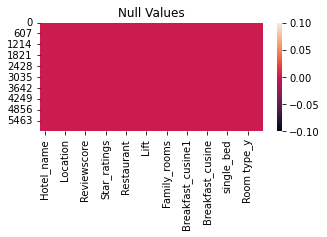

In [18]:
#Visualizing null values
plt.figure(figsize=[5,2])
sns.heatmap(df1.isna())
plt.title("Null Values")
plt.show()


In [19]:
#preprpocessing technique
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
for column in df1.columns:
    df1[column] = labelencoder.fit_transform(df1[column])

In [20]:
df1.dtypes

Hotel_name           int32
Cities               int32
Location             int32
No_of_reviews        int32
Reviewscore          int32
User_ratings         int32
Star_ratings         int32
Non_smoking_rooms    int32
Restaurant           int32
Freewifi             int32
Lift                 int32
Heating              int32
Family_rooms         int32
Bar                  int32
Breakfast_cusine1    int32
Breakfast_cusine2    int32
Breakfast_cusine     int32
Room type_x          int32
single_bed           int32
Prices               int32
Room type_y          int32
Double_bed           int32
dtype: object

In [118]:
f=df1.duplicated()
f

0       False
1       False
2       False
3       False
4       False
        ...  
6057    False
6058    False
6059    False
6060    False
6061    False
Length: 6062, dtype: bool

there is no duplicates presented.

In [21]:
df1['Bar'].value_counts()

0    4817
1    1245
Name: Bar, dtype: int64

In [22]:
df1['User_ratings'].value_counts()

1     614
74    276
75    240
77    238
76    237
     ... 
92      1
97      1
99      1
93      1
4       1
Name: User_ratings, Length: 101, dtype: int64

In [23]:
df1['Star_ratings'].value_counts()

4    1958
6    1604
0    1204
8     842
2     323
1      51
7      47
5      28
3       5
Name: Star_ratings, dtype: int64

In [24]:
df1['Reviewscore'].value_counts()

6     1531
11    1456
5      702
1      614
8      606
10     317
7      252
0      186
3      150
4       89
9       69
12      49
2       41
Name: Reviewscore, dtype: int64

In [25]:
df1['Bar'].replace({'YES':1},inplace= True)


In [26]:
df1['Bar'].value_counts()

0    4817
1    1245
Name: Bar, dtype: int64

In [27]:
df1['Restaurant'].replace({'YES':1},inplace=True)
df1['Lift'].replace({'YES':1},inplace=True)
df1['Family_rooms'].replace({'YES':1},inplace=True)

df1['Freewifi'].replace({'YES':1},inplace=True)
df1['Non_smoking_rooms'].replace({'YES':1},inplace=True)
df1['Heating'].replace({'YES':1},inplace=True)



In [28]:
#checking unique values for given dataset

df1.nunique().to_frame("Unique values")

,Unique values
Hotel_name,5338
Cities,13
Location,4180
No_of_reviews,2489
Reviewscore,13
User_ratings,101
Star_ratings,9
Non_smoking_rooms,2
Restaurant,2
Freewifi,2


In [29]:
df1.describe()

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Prices,Room type_y,Double_bed
count,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,...,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000,6062.000000
mean,2685.907786,5.908776,1841.513197,1111.467008,6.797262,58.469317,4.185582,0.589080,0.311613,0.828439,...,0.513362,0.205378,1.326460,10.949522,3.583636,85.035797,0.246453,1466.147806,21.385021,0.115308
std,1545.166794,3.442711,1326.351603,808.130805,3.344338,26.293898,2.605637,0.492041,0.463191,0.377029,...,0.499863,0.404011,2.326257,31.940896,13.594264,175.469095,0.430981,524.282238,68.235395,0.319420
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1329.250000,3.000000,586.250000,352.250000,5.000000,54.000000,2.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1277.250000,0.000000,0.000000
50%,2732.500000,5.000000,1790.500000,1149.000000,6.000000,69.000000,4.000000,1.000000,0.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1778.000000,0.000000,0.000000
75%,4027.750000,9.000000,3008.750000,1822.000000,10.000000,76.000000,6.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1778.000000,0.000000,0.000000
max,5337.000000,12.000000,4179.000000,2488.000000,12.000000,100.000000,8.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,12.000000,166.000000,96.000000,683.000000,1.000000,1778.000000,348.000000,1.000000


As per my observation, the value count is same in all the columns which indicates no missing data. The difference between the mean and standard devaition of each is not very less.

The mean value is more than 50% of median in all columns so, there will skewness problem. Also we can have min, 75%, max values.

# visualization

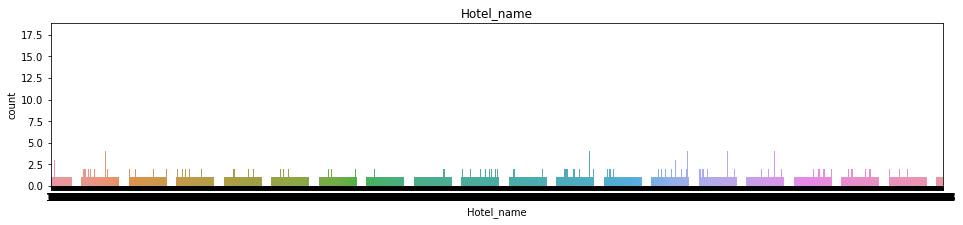

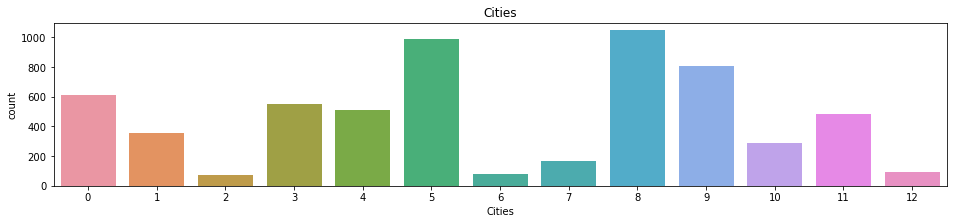

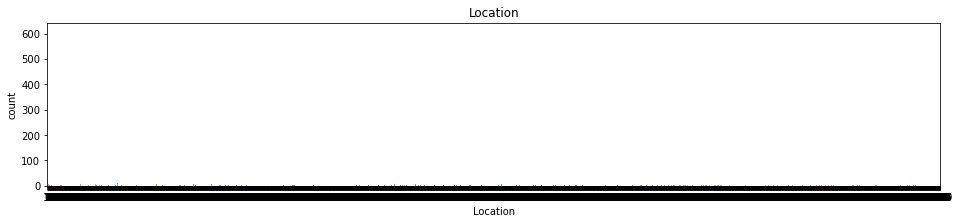

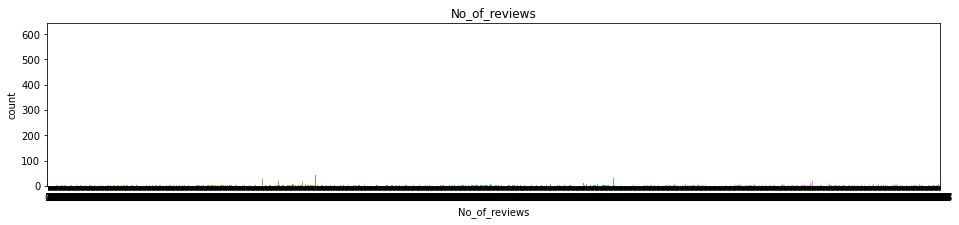

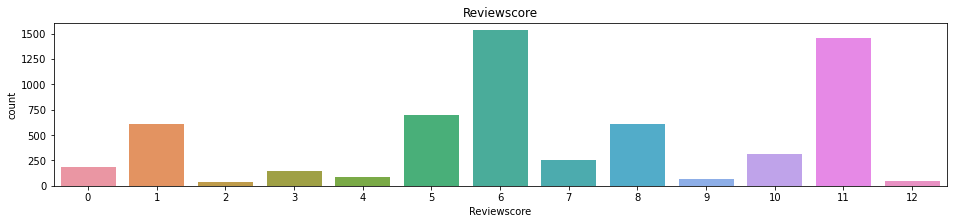

...

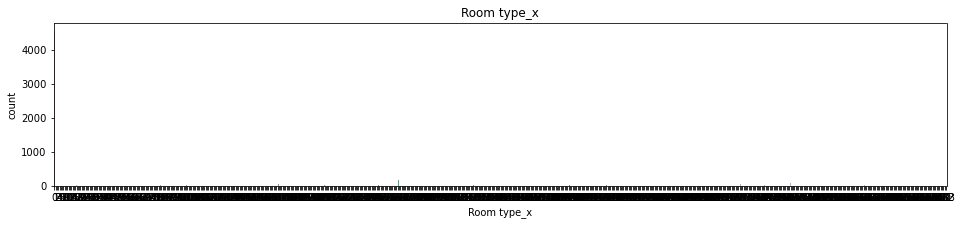

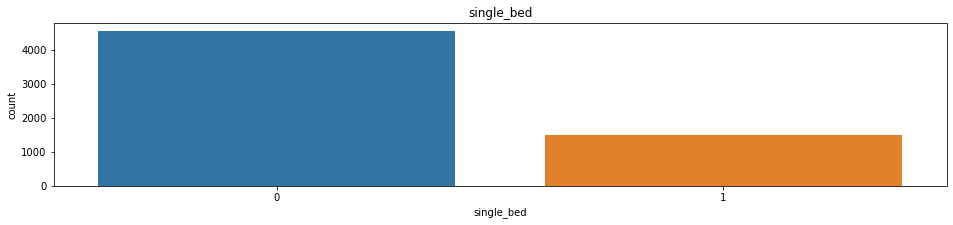

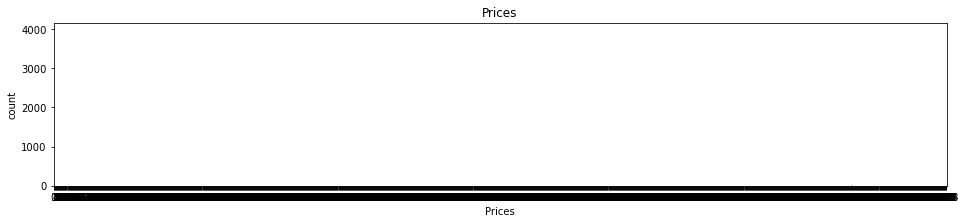

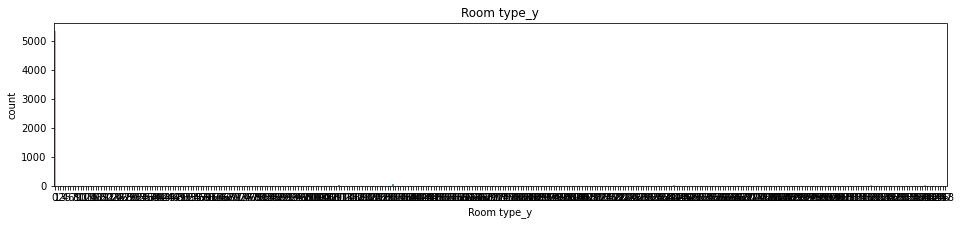

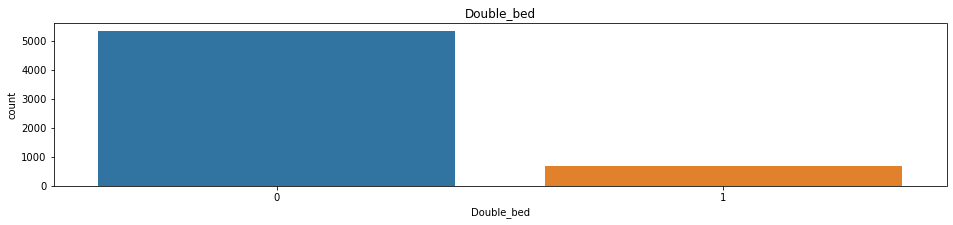

In [31]:
#distribution plot for numerical columns
for k in df1:              
    plt.figure(figsize = (16, 3))
    sns.countplot(df1[k])
    plt.title(k)
    plt.show()

<AxesSubplot:xlabel='Reviewscore', ylabel='Restaurant'>

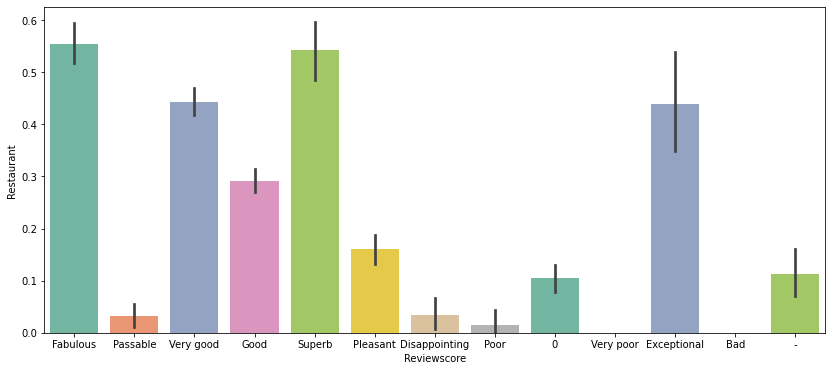

In [23]:
plt.figure(figsize=(14,6))
sns.barplot(x = 'Reviewscore', y = 'Restaurant', data =df1, palette = 'Set2')

<AxesSubplot:xlabel='Reviewscore', ylabel='Heating'>

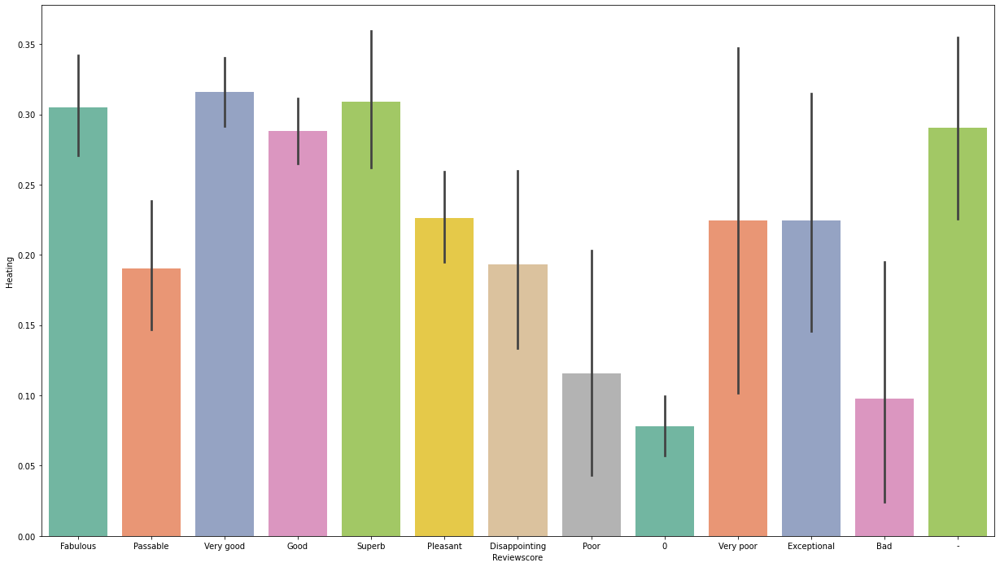

In [31]:
plt.figure(figsize=(21,12))
sns.barplot(x = 'Reviewscore', y = 'Heating', data =df1, palette = 'Set2')

<AxesSubplot:xlabel='Reviewscore', ylabel='Lift'>

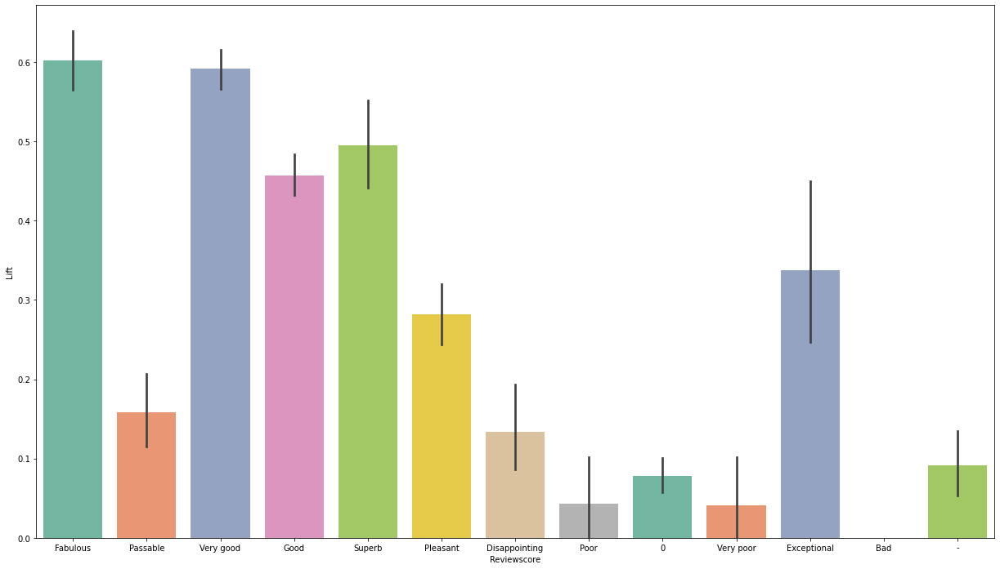

In [33]:
plt.figure(figsize=(21,12))
sns.barplot(x = 'Reviewscore', y = 'Lift', data =df1, palette = 'Set2')

<AxesSubplot:xlabel='Reviewscore', ylabel='Freewifi'>

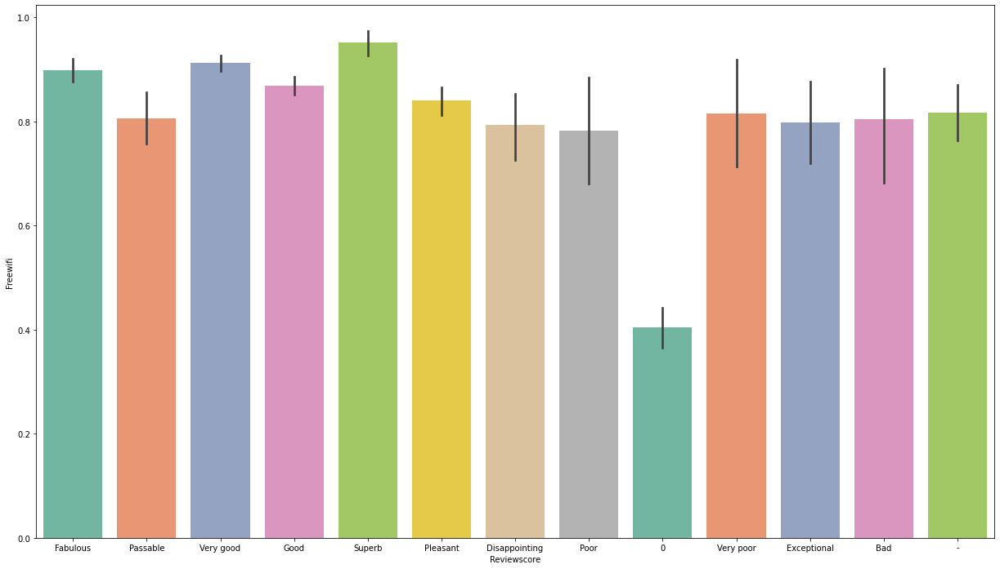

In [36]:
plt.figure(figsize=(21,12))
sns.barplot(x = 'Reviewscore', y = 'Freewifi', data =df1, palette = 'Set2')

<AxesSubplot:xlabel='Reviewscore', ylabel='Heating'>

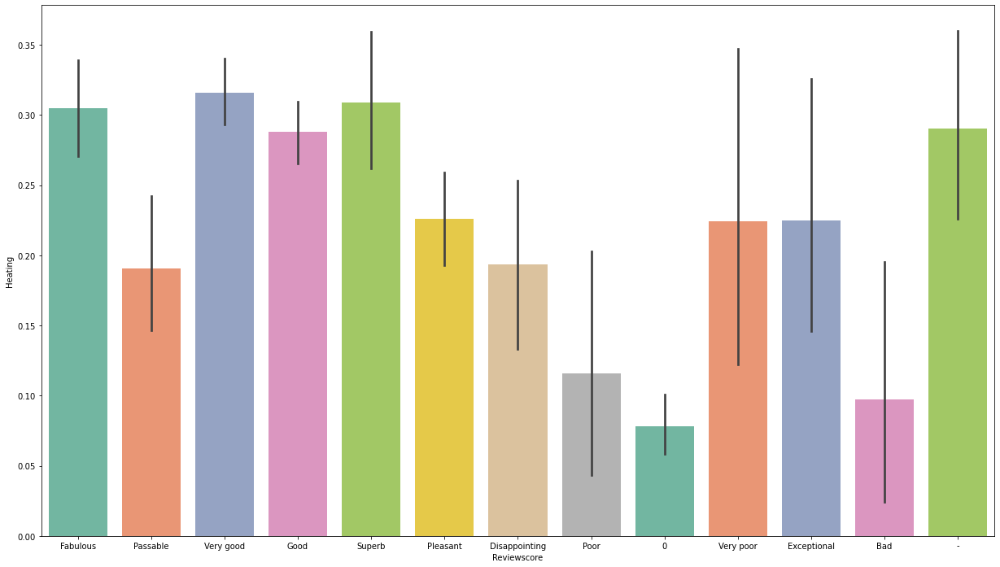

In [42]:
plt.figure(figsize=(21,12))
sns.barplot(x = 'Reviewscore', y = 'Heating', data =df1, palette = 'Set2')

<AxesSubplot:xlabel='Reviewscore', ylabel='Room type_x'>

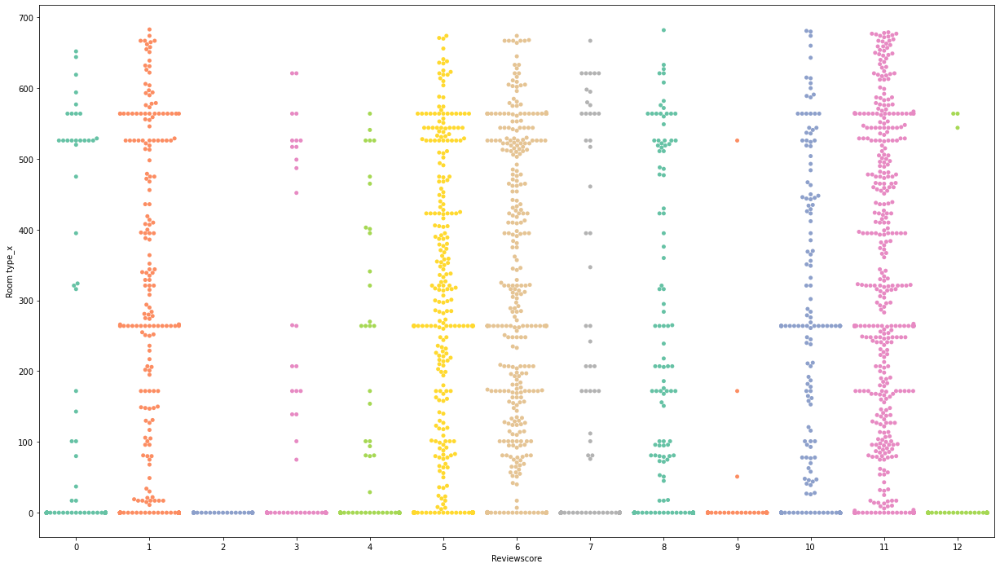

In [73]:
plt.figure(figsize=(21,12))
sns.swarmplot(x = 'Reviewscore', y = 'Room type_x', data =df1, palette = 'Set2')

# Multivariate Analysis

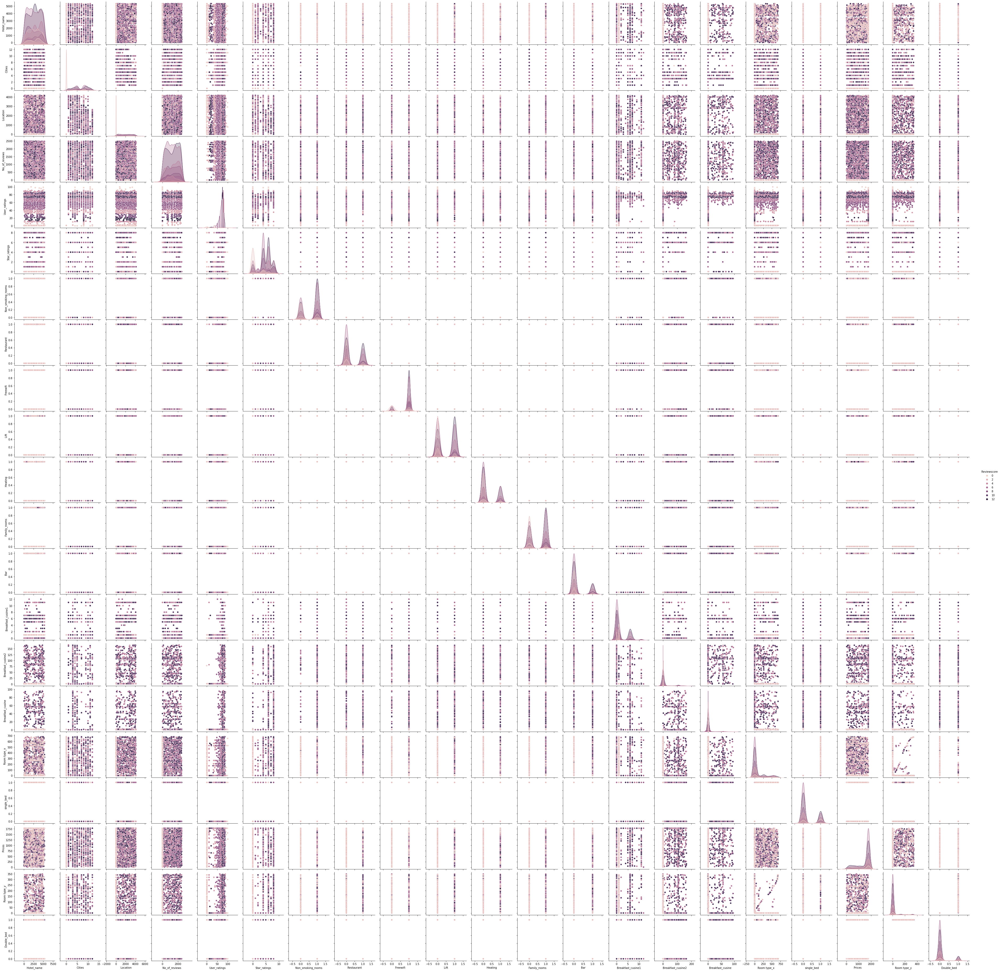

In [128]:
#pair ploting for hotel data
sns.pairplot(df1,hue='Reviewscore')

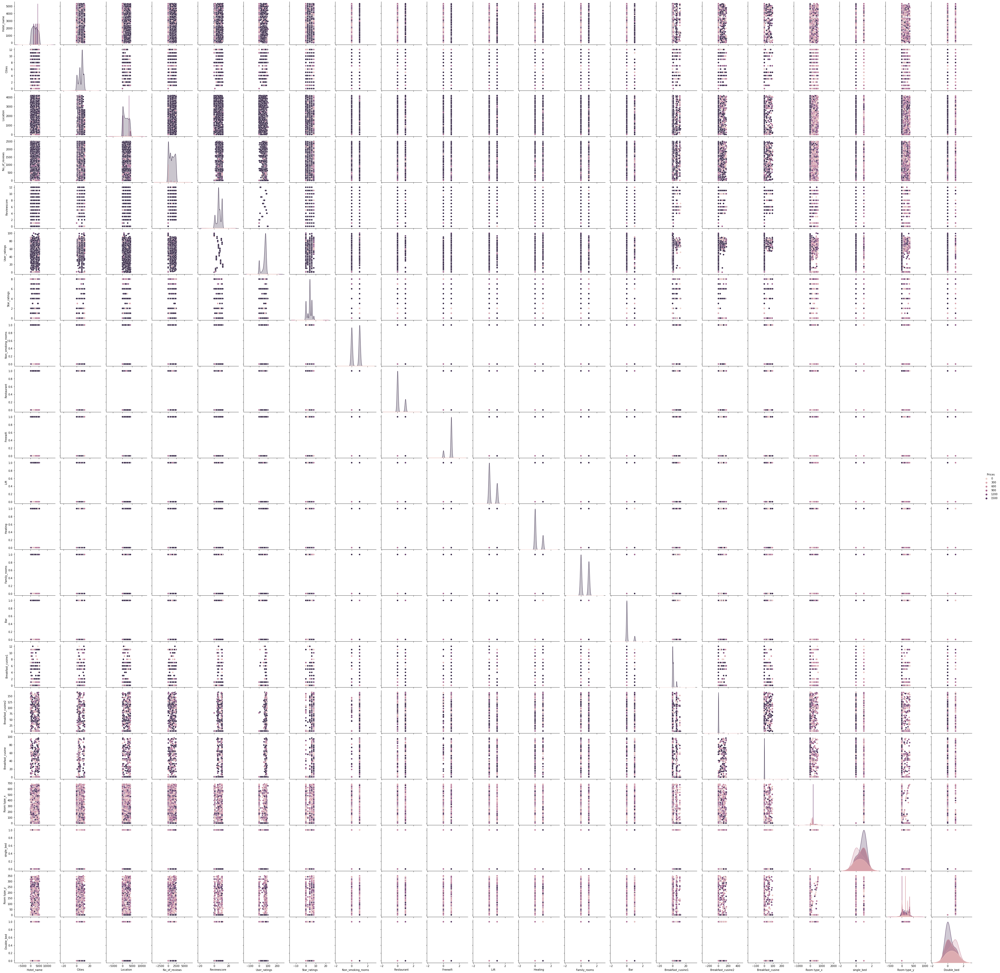

In [129]:
#pair ploting for hotel data
sns.pairplot(df1,hue='Prices')

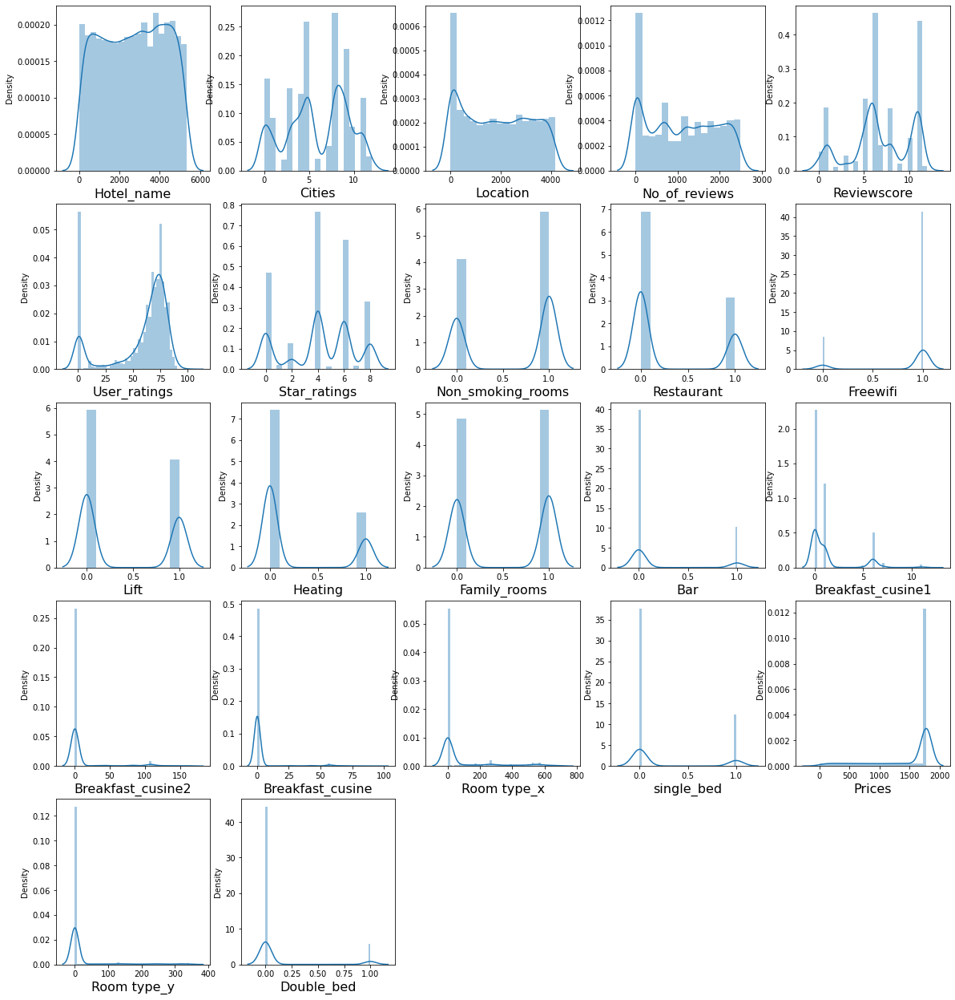

In [193]:
plt.figure(figsize=(20,22),facecolor="white")
plotnumber=1
for columns in df1:
    if plotnumber<=22:
    
        ax=plt.subplot(5,5,plotnumber)
        sns.distplot(df1[columns])
        plt.xlabel(columns, fontsize=16)
        
    plotnumber+=1
plt.show()

<AxesSubplot:>

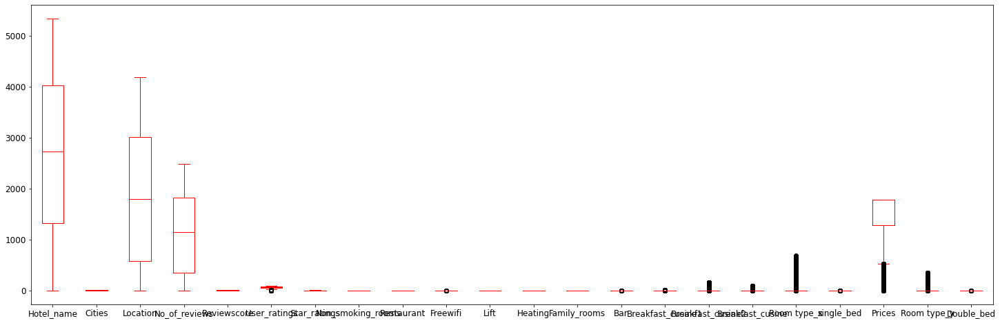

In [194]:
df1.plot(kind='box',fontsize=12,figsize=(25,8),color='r')

In [55]:
# removing outliers using statsmodel
from scipy import stats
from scipy.stats import zscore
data1=df1.drop(['Prices','Reviewscore'], axis=1)
z=np.abs(zscore(data1))

threshold=3
np.where(z>3)
data=df1[(z<3).all(axis=1)]

In [56]:
data

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Prices,Room type_y,Double_bed
0,3214,6,18,2279,5,81,4,1,0,1,...,0,0,6,0,0,0,0,1778,0,0
1,3213,6,645,628,5,78,4,1,0,1,...,0,0,6,0,0,0,0,1778,0,0
3,2867,6,1323,2136,11,77,6,1,1,1,...,1,0,7,0,0,0,0,1778,0,0
4,4110,6,4068,650,7,49,4,1,0,0,...,1,0,7,0,0,595,1,430,0,0
5,2730,6,3771,1721,5,81,8,1,1,1,...,1,0,6,0,0,7,1,1417,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6057,1197,0,3,1,1,1,0,0,0,0,...,0,0,1,1,1,408,1,1540,0,0
6058,1197,0,3,1,1,1,0,0,0,0,...,0,0,1,1,1,0,0,58,64,1
6059,4456,0,3,1,1,1,0,0,0,0,...,0,0,1,1,1,395,1,675,0,0
6060,278,0,3,1,1,1,0,0,0,0,...,0,0,1,1,1,0,0,1486,50,1


In [57]:
z

,Hotel_name,Cities,Location,No_of_reviews,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,Lift,Heating,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Room type_y,Double_bed
0,0.341799,0.026500,1.374947,1.444852,0.856949,0.071229,0.835203,0.672809,0.455070,0.829807,1.690040,1.027091,0.508389,2.009204,0.342834,0.263636,0.484660,0.571890,0.313427,0.361023
1,0.341151,0.026500,0.902183,0.598303,0.742845,0.071229,0.835203,0.672809,0.455070,1.205100,1.690040,1.027091,0.508389,2.009204,0.342834,0.263636,0.484660,0.571890,0.313427,0.361023
2,1.438091,0.026500,0.176071,0.063773,0.360163,0.071229,0.835203,0.672809,2.197464,0.829807,1.690040,0.973624,0.508389,2.009204,0.342834,0.263636,3.054717,1.748589,0.313427,0.361023
3,0.117209,0.026500,0.390964,1.267886,0.704810,0.696401,0.835203,1.486306,0.455070,1.205100,1.690040,0.973624,0.508389,2.439115,0.342834,0.263636,0.484660,0.571890,0.313427,0.361023
4,0.921719,0.026500,1.678794,0.571077,0.360163,0.071229,0.835203,0.672809,2.197464,0.829807,1.690040,0.973624,0.508389,2.439115,0.342834,0.263636,2.906530,1.748589,0.313427,0.361023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6057,0.963670,1.716456,1.386258,1.374231,2.185833,1.606489,1.197314,0.672809,2.197464,0.829807,0.591702,1.027091,0.508389,0.140349,0.311524,0.190069,1.840728,1.748589,0.313427,0.361023
6058,0.963670,1.716456,1.386258,1.374231,2.185833,1.606489,1.197314,0.672809,2.197464,0.829807,0.591702,1.027091,0.508389,0.140349,0.311524,0.190069,0.484660,0.571890,0.624580,2.769908
6059,1.145662,1.716456,1.386258,1.374231,2.185833,1.606489,1.197314,0.672809,2.197464,0.829807,0.591702,1.027091,0.508389,0.140349,0.311524,0.190069,1.766635,1.748589,0.313427,0.361023
6060,1.558477,1.716456,1.386258,1.374231,2.185833,1.606489,1.197314,0.672809,2.197464,0.829807,0.591702,1.027091,0.508389,0.140349,0.311524,0.190069,0.484660,0.571890,0.419391,2.769908


In [58]:
loss_data=(6062-5244)/6062*100
loss_data

13.493896403827119

In [71]:
data.skew()

Hotel_name          -0.005038
Cities              -0.350432
Location             0.175102
No_of_reviews        0.083333
Reviewscore         -0.294295
User_ratings        -1.273164
Star_ratings        -0.274776
Non_smoking_rooms   -0.188528
Restaurant           0.986911
Freewifi            -1.776530
Lift                 0.519489
Heating              1.143328
Family_rooms         0.047319
Bar                  1.882840
Breakfast_cusine1    2.113578
Breakfast_cusine2    1.876009
Breakfast_cusine     1.200734
Room type_x          2.196439
single_bed           1.403710
Prices              -1.837651
Room type_y          4.668140
Double_bed           3.535535
dtype: float64

In [67]:
data['Breakfast_cusine2']=np.sqrt(data['Breakfast_cusine2'])

In [70]:
data['Double_bed']=np.sqrt(data['Double_bed'])

In [72]:

#corelation b/n features and target variable.
corr=data.corr()
corr

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Prices,Room type_y,Double_bed
Hotel_name,1.000000,-0.033967,-0.007895,0.010256,0.001324,0.029806,0.034858,0.074113,0.058283,0.013437,...,0.014723,0.029151,0.043375,-0.013253,-0.047460,0.047552,0.053142,-0.056640,0.033996,0.039614
Cities,-0.033967,1.000000,-0.013906,0.265666,0.340629,0.437330,0.357218,-0.174561,0.030568,0.265169,...,0.001161,-0.163280,-0.001018,-0.098391,-0.155408,-0.110264,-0.135088,0.129908,-0.051771,-0.065308
Location,-0.007895,-0.013906,1.000000,0.216965,0.212984,0.226359,0.120544,0.041079,-0.024249,0.115557,...,0.097246,0.141528,0.023145,0.012058,0.003886,-0.015358,-0.007002,-0.008807,0.007737,0.010303
No_of_reviews,0.010256,0.265666,0.216965,1.000000,0.404540,0.488291,0.200323,0.133438,0.106365,0.181724,...,0.145824,0.063160,-0.017775,-0.134975,-0.226438,-0.015231,-0.015907,0.016822,-0.012959,-0.013020
Reviewscore,0.001324,0.340629,0.212984,0.404540,1.000000,0.699317,0.301075,0.185772,0.173618,0.272792,...,0.235879,0.093740,0.084712,-0.244641,-0.379253,-0.020639,-0.010701,-0.002712,-0.008364,-0.007361
User_ratings,0.029806,0.437330,0.226359,0.488291,0.699317,1.000000,0.426975,0.287911,0.285291,0.340615,...,0.350830,0.143492,0.084051,-0.318932,-0.536279,0.025489,0.039302,-0.035262,0.027852,0.026339
Star_ratings,0.034858,0.357218,0.120544,0.200323,0.301075,0.426975,1.000000,0.151696,0.359556,0.199272,...,0.206337,0.229037,0.219184,0.023325,-0.151158,0.148120,0.195087,-0.173300,0.105483,0.120174
Non_smoking_rooms,0.074113,-0.174561,0.041079,0.133438,0.185772,0.287911,0.151696,1.000000,0.371126,0.075647,...,0.238271,0.183907,0.062696,-0.277057,-0.459610,0.111019,0.140997,-0.149190,0.051829,0.057640
Restaurant,0.058283,0.030568,-0.024249,0.106365,0.173618,0.285291,0.359556,0.371126,1.000000,0.048478,...,0.166995,0.212568,0.244823,-0.020873,-0.240301,0.131673,0.165065,-0.140289,0.092633,0.117804
Freewifi,0.013437,0.265169,0.115557,0.181724,0.272792,0.340615,0.199272,0.075647,0.048478,1.000000,...,0.163350,0.030260,0.040578,-0.131735,-0.207009,-0.059977,-0.076653,0.068484,-0.020228,-0.020465


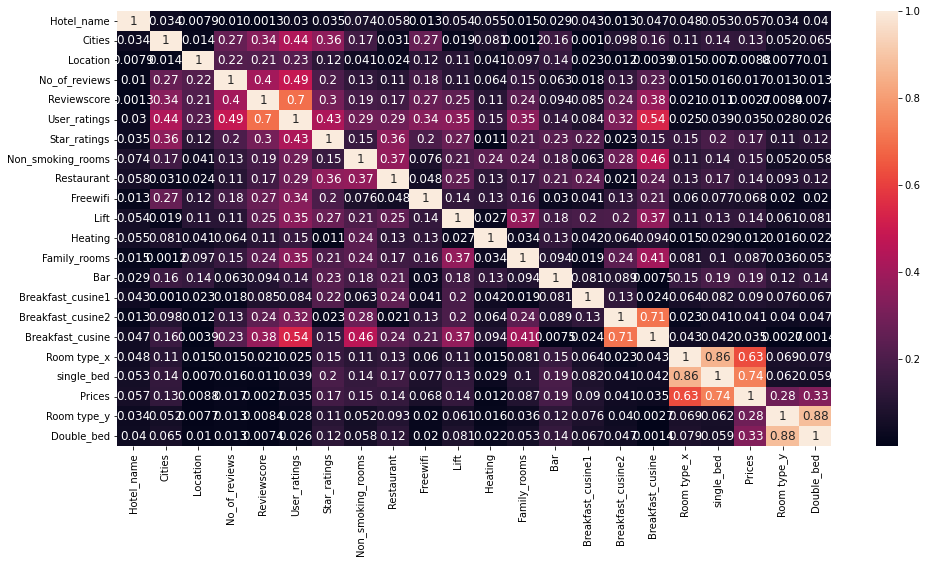

In [73]:
df_corr=data.corr().abs()
plt.figure(figsize=(16,8))
sns.heatmap(df_corr, annot=True, linecolor='blue', annot_kws={'size':12},)
plt.show()

In [60]:
data=data.drop(['Room type_y','Double_bed'],axis=1)

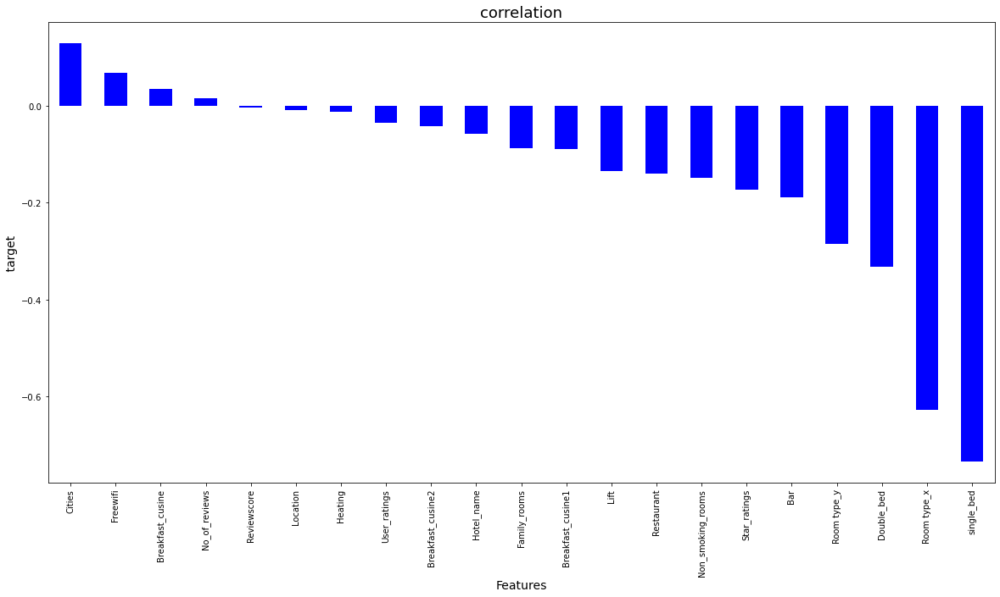

In [74]:
plt.figure(figsize=(20,10))
data.corr()['Prices'].sort_values(ascending=False).drop(['Prices']).plot(kind='bar',color='b')
plt.xlabel('Features',fontsize=14)
plt.ylabel(' target ',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

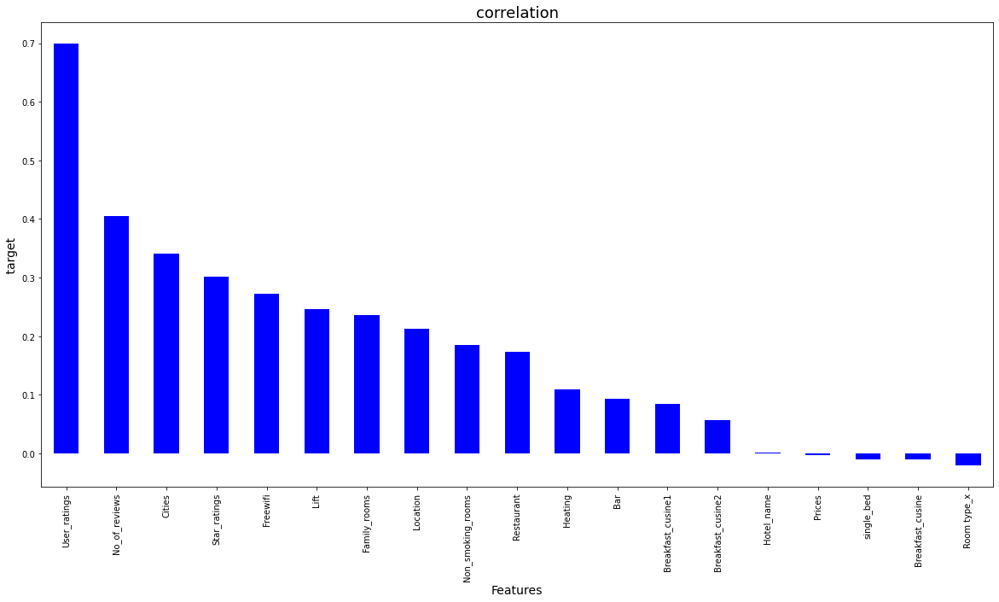

In [206]:
plt.figure(figsize=(20,10))
data.corr()['Reviewscore'].sort_values(ascending=False).drop(['Reviewscore']).plot(kind='bar',color='b')
plt.xlabel('Features',fontsize=14)
plt.ylabel(' target ',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

In [76]:
b1 =data["Prices"]
b2 = data["Reviewscore"]
a = data.drop(["Prices","Reviewscore"], axis=1)

In [77]:
scaler=StandardScaler()

x_scaled=scaler.fit_transform(a)
x_scaled
a=pd.DataFrame(scaler.fit_transform(a),columns=a.columns)
a

,Hotel_name,Cities,Location,No_of_reviews,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,Lift,Heating,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Room type_y,Double_bed
0,0.360812,-0.023441,-1.344022,1.444389,0.906273,0.036222,0.910193,-0.621746,0.449361,-0.773494,1.723288,-0.976627,-0.432081,2.581666,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
1,0.360160,-0.023441,-0.866444,-0.576472,0.793434,0.036222,0.910193,-0.621746,0.449361,1.292835,1.723288,-0.976627,-0.432081,2.581666,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
2,0.134504,-0.023441,-0.350019,1.269354,0.755822,0.834328,0.910193,1.608374,0.449361,1.292835,1.723288,1.023932,-0.432081,3.103734,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
3,0.945167,-0.023441,1.740813,-0.549544,-0.297338,0.036222,0.910193,-0.621746,-2.225382,-0.773494,1.723288,1.023932,-0.432081,3.103734,-0.628947,-0.654684,3.388674,1.923259,-0.231608,-0.263308
4,0.045155,-0.023441,1.514592,0.761384,0.906273,1.632433,0.910193,1.608374,0.449361,1.292835,1.723288,1.023932,-0.432081,2.581666,-0.628947,-0.654684,-0.400060,1.923259,-0.231608,-0.263308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5239,-0.954640,-1.758880,-1.355447,-1.343934,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,-0.773494,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,2.183754,1.923259,-0.231608,-0.263308
5240,-0.954640,-1.758880,-1.355447,-1.343934,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,-0.773494,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,-0.445164,-0.519951,1.753766,3.797832
5241,1.170823,-1.758880,-1.355447,-1.343934,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,-0.773494,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,2.099989,1.923259,-0.231608,-0.263308
5242,-1.553996,-1.758880,-1.355447,-1.343934,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,-0.773494,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,-0.445164,-0.519951,1.319465,3.797832


In [78]:
x_scaled

array([[ 0.36081182, -0.02344144, -1.34402157, ..., -0.5199508 ,
        -0.23160805, -0.26330811],
       [ 0.36015963, -0.02344144, -0.8664435 , ..., -0.5199508 ,
        -0.23160805, -0.26330811],
       [ 0.13450445, -0.02344144, -0.35001937, ..., -0.5199508 ,
        -0.23160805, -0.26330811],
       ...,
       [ 1.17082261, -1.75888   , -1.35544688, ...,  1.92325888,
        -0.23160805, -0.26330811],
       [-1.5539963 , -1.75888   , -1.35544688, ..., -0.5199508 ,
         1.31946547,  3.7978322 ],
       [ 0.35168126, -1.75888   , -1.35544688, ..., -0.5199508 ,
         6.46902955,  3.7978322 ]])

In [79]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(a.values,i) for i in range(len(a.columns))] 

vif['features']=a.columns
vif

,VIF values,features
0,1.018524,Hotel_name
1,1.861494,Cities
2,1.155112,Location
3,1.357724,No_of_reviews
4,2.604541,User_ratings
5,1.701472,Star_ratings
6,1.681758,Non_smoking_rooms
7,1.437245,Restaurant
8,1.192522,Freewifi
9,1.424561,Lift


Now no worries about multicollinearity

In [133]:
b2.value_counts()

5     1531
10    1456
4      702
12     614
7      606
9      317
6      252
0      186
2      150
3       89
8       69
11      49
1       41
Name: Reviewscore, dtype: int64

In [80]:
#balancing the label values.
from imblearn.over_sampling import SMOTE
sampling= SMOTE()

a,b2=sampling.fit_resample(a,b2)

In [67]:
b2.value_counts()

5     1390
11    1390
7     1390
6     1390
10    1390
8     1390
3     1390
9     1390
1     1390
12    1390
2     1390
0     1390
4     1390
Name: Reviewscore, dtype: int64

In [137]:
scaler=StandardScaler()

x_scaled=scaler.fit_transform(a)
x_scaled

array([[ 0.36172986, -0.44679816, -1.84773077, ...,  0.49646539,
         0.2682186 ,  0.32106472],
       [ 0.36102475, -0.44679816, -1.34932533, ...,  0.49646539,
         0.2682186 ,  0.32106472],
       [-1.5773242 , -0.44679816, -0.58383179, ..., -2.09812695,
         0.2682186 ,  0.32106472],
       ...,
       [ 0.60964113,  1.95289345,  1.46066392, ...,  0.49646539,
         0.2682186 ,  0.32106472],
       [-1.5412242 ,  1.95289345,  1.46066392, ...,  0.49646539,
         0.2682186 ,  0.32106472],
       [-0.7056993 ,  1.95289345,  1.46066392, ..., -2.09812695,
         0.01408187, -3.21755984]])

# Modelling

# Extratrees classifier model

# prediction on Reviewscore

In [138]:
from sklearn.ensemble import ExtraTreesClassifier, GradientBoostingClassifier,BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

In [139]:
#getting best random state

Accu_max=0
Rs_max=0
for k in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(a,b2, test_size=0.22, random_state=k)
    
    RFC=RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred=RFC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu_max:
        Accu_max= acc
        Rs_max=k
print('The best accuracy is', Accu_max, 'at random state is', Rs_max)

The best accuracy is 0.9963461977620461 at random state is 77


In [140]:
#forming train_test_split
x_train,x_test,y_train,y_test=train_test_split(a,b2, test_size=0.22, random_state=77)

In [141]:
def metric_score(clf, x_train,x_test,y_train,y_test,train=True):
    if train==False:
        pred=clf.predict(x_test)
        
        print("\n================ Test Result ================== ")
        print(f"Accuracy Score: {accuracy_score(y_test,pred)*100:2f}%")
        print('\n \n Test Classification Reprt \n', classification_report(y_test,pred, digits=2))
        

In [142]:
dc=DecisionTreeClassifier()
dc.fit(x_train,y_train)
metric_score(dc,x_train,x_test,y_train,y_test, train=True)
metric_score(dc,x_train,x_test,y_train,y_test, train=False)
y_pred=dc.predict(x_test)
probs_dc=dc.predict_proba(x_scaled)[:,1]
confusion_matrix(y_test,y_pred)


================ Test Result ================== 
Accuracy Score: 99.954327%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       1.00      1.00      1.00       334
           5       1.00      1.00      1.00       329
           6       1.00      1.00      1.00       366
           7       1.00      1.00      1.00       337
           8       1.00      1.00      1.00       319
           9       1.00      1.00      1.00       344
          10       1.00      1.00      1.00       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           1.00      4379
   macro avg       1.00      1.00      1.00      4379
weighted avg       1.00  

array([[323,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0, 326,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 335,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   1, 340,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 334,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0, 329,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   1,   0,   0, 365,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0, 337,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 319,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 344,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 335,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 342,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 348]],
      dtype=int64)

In [144]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
metric_score(rfc,x_train,x_test,y_train,y_test, train=True)
metric_score(rfc,x_train,x_test,y_train,y_test, train=False)
y_pred=rfc.predict(x_test)
probs_rfc=rfc.predict_proba(x_scaled)[:,1]
confusion_matrix(y_test,y_pred)


================ Test Result ================== 
Accuracy Score: 99.543275%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       1.00      0.99      1.00       334
           5       0.97      0.99      0.98       329
           6       0.99      1.00      1.00       366
           7       0.99      0.99      0.99       337
           8       1.00      1.00      1.00       319
           9       1.00      0.99      1.00       344
          10       1.00      0.98      0.99       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           1.00      4379
   macro avg       1.00      1.00      1.00      4379
weighted avg       1.00  

array([[323,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0, 326,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 335,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 341,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   1, 331,   1,   1,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0, 326,   0,   2,   0,   0,   1,   0,   0],
       [  0,   0,   0,   0,   0,   0, 366,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   4,   1, 332,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 319,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   1,   0,   1,   0, 342,   0,   0,   0],
       [  0,   0,   0,   0,   0,   5,   0,   2,   0,   0, 328,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 342,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 348]],
      dtype=int64)

In [145]:
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
metric_score(GB,x_train,x_test,y_train,y_test, train=True)
metric_score(GB,x_train,x_test,y_train,y_test, train=False)
y_pred=GB.predict(x_test)
probs_GB=GB.predict_proba(x_scaled)[:,1]
confusion_matrix(y_test,y_pred)


================ Test Result ================== 
Accuracy Score: 99.931491%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       1.00      1.00      1.00       334
           5       1.00      1.00      1.00       329
           6       1.00      1.00      1.00       366
           7       1.00      1.00      1.00       337
           8       1.00      1.00      1.00       319
           9       1.00      1.00      1.00       344
          10       1.00      1.00      1.00       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           1.00      4379
   macro avg       1.00      1.00      1.00      4379
weighted avg       1.00  

array([[322,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   0],
       [  0, 326,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 335,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   1, 340,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 334,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0, 329,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   1,   0,   0, 365,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0, 337,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 319,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 344,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 335,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 342,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 348]],
      dtype=int64)

In [146]:
bag=BaggingClassifier()
bag.fit(x_train,y_train)
metric_score(bag,x_train,x_test,y_train,y_test, train=True)
metric_score(bag,x_train,x_test,y_train,y_test, train=False)
y_pred=bag.predict(x_test)
confusion_matrix(y_test,y_pred)


================ Test Result ================== 
Accuracy Score: 99.954327%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       1.00      1.00      1.00       334
           5       1.00      1.00      1.00       329
           6       1.00      1.00      1.00       366
           7       1.00      1.00      1.00       337
           8       1.00      1.00      1.00       319
           9       1.00      1.00      1.00       344
          10       1.00      1.00      1.00       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           1.00      4379
   macro avg       1.00      1.00      1.00      4379
weighted avg       1.00  

array([[323,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0, 326,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 335,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   1, 340,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   1, 333,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0, 329,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0, 366,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0, 337,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 319,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 344,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 335,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 342,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 348]],
      dtype=int64)

In [147]:
Etc=ExtraTreesClassifier()
Etc.fit(x_train,y_train)
metric_score(Etc,x_train,x_test,y_train,y_test, train=True)
metric_score(Etc,x_train,x_test,y_train,y_test, train=False)
y_pred=Etc.predict(x_test)
probs_Etc=Etc.predict_proba(x_scaled)[:,1]
confusion_matrix(y_test,y_pred)


================ Test Result ================== 
Accuracy Score: 98.310116%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       0.96      0.97      0.97       334
           5       0.93      0.91      0.92       329
           6       1.00      1.00      1.00       366
           7       0.98      0.96      0.97       337
           8       1.00      1.00      1.00       319
           9       0.99      1.00      0.99       344
          10       0.93      0.95      0.94       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           0.98      4379
   macro avg       0.98      0.98      0.98      4379
weighted avg       0.98  

array([[319,   0,   0,   1,   0,   2,   0,   0,   0,   0,   0,   1,   0],
       [  0, 326,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 335,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 341,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 325,   1,   0,   0,   0,   5,   3,   0,   0],
       [  0,   0,   0,   0,   1, 301,   0,   5,   0,   0,  22,   0,   0],
       [  0,   0,   0,   0,   0,   0, 366,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,  13,   1, 323,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 319,   0,   0,   0,   0],
       [  0,   0,   0,   0,   1,   0,   0,   0,   0, 343,   0,   0,   0],
       [  0,   0,   0,   0,  11,   7,   0,   0,   0,   0, 317,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 342,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 348]],
      dtype=int64)

# Crossvalidation

In [148]:
score=cross_val_score(dc, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.99397136 0.99773926 0.99824165 0.99874372 0.99899497]
0.9975381933531006
Difference between Accuracy score and cross validation score is-  -0.9274308629123607


In [150]:
score=cross_val_score(GB, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.99924642 0.99849284 0.99874403 0.99924623 0.99899497]
0.9989449003369018
Difference between Accuracy score and cross validation score is-  -0.9288375698961618


In [151]:
score=cross_val_score(GB, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.99924642 0.99849284 0.99874403 0.99924623 0.99874372]
0.9988946490806203
Difference between Accuracy score and cross validation score is-  -0.9287873186398804


In [152]:
score=cross_val_score(Etc, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.93971364 0.9412208  0.9741271  0.93442211 0.88517588]
0.9349319064551596
Difference between Accuracy score and cross validation score is-  -0.8648245760144196


In [153]:
score=cross_val_score(bag, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.99773926 0.99849284 0.99874403 0.99874372 0.99849246]
0.9984424635107212
Difference between Accuracy score and cross validation score is-  -0.9283351330699813


In [154]:
score=cross_val_score(rfc, a,b2)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is- ", accuracy_score(y_test, pred)-score.mean() )

[0.95151972 0.98568199 0.99372017 0.97462312 0.90050251]
0.9612095014131194
Difference between Accuracy score and cross validation score is-  -0.8911021709723795


after doing crossvalidation here i am considering Extratreesclassier model as a best model and tuning those parameters to increase my score.

#  Hyperparameter tuning

In [ ]:
grid_param={
    'criterion':['gini','entropy'],
    'max_depth':range(20,42),
    'min_samples_leaf': range(1,4),
    'min_samples_split':range(1,5),
    'max_leaf_nodes' :range(20,40)
}

In [156]:
grid_search=GridSearchCV(estimator=Etc,
                        param_grid=grid_param,
                        cv=5,
                         n_jobs=-1)

In [157]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(20, 42),
                         'max_leaf_nodes': range(20, 40),
                         'min_samples_leaf': range(1, 4),
                         'min_samples_split': range(1, 5)})

In [158]:
#finding the best parameters
best_parameters=grid_search.best_params_
print(best_parameters)

{'criterion': 'gini', 'max_depth': 20, 'max_leaf_nodes': 39, 'min_samples_leaf': 1, 'min_samples_split': 3}


In [405]:
final_model_Etc=ExtraTreesClassifier( max_depth= 5320, max_leaf_nodes=5616, min_samples_leaf= 1, min_samples_split=2)
final_model_Etc.fit(x_train,y_train)
metric_score(final_model_Etc,x_train,x_test,y_train,y_test,train=False)


================ Test Result ================== 
Accuracy Score: 98.606988%

 
 Test Classification Reprt 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       323
           1       1.00      1.00      1.00       326
           2       1.00      1.00      1.00       335
           3       1.00      1.00      1.00       341
           4       0.97      0.98      0.97       334
           5       0.94      0.93      0.94       329
           6       1.00      1.00      1.00       366
           7       0.99      0.98      0.98       337
           8       1.00      1.00      1.00       319
           9       0.99      1.00      0.99       344
          10       0.94      0.94      0.94       335
          11       1.00      1.00      1.00       342
          12       1.00      1.00      1.00       348

    accuracy                           0.99      4379
   macro avg       0.99      0.99      0.99      4379
weighted avg       0.99  

Yes, my score is slightly increased it is a best model.

# Save the model

In [412]:
#saving my model
import pickle

filename='Reviewscore prediction on bookingdata'
pickle.dump(Etc, open(filename,'wb'))


In [413]:
import pickle
loaded_model=pickle.load(open('Reviewscore prediction on bookingdata','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

98.31011646494633


In [414]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['original','predicted'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,4369,4370,4371,4372,4373,4374,4375,4376,4377,4378
original,10,1,5,9,12,3,4,10,8,0,...,2,0,6,12,8,1,9,11,1,7
predicted,10,1,5,9,12,3,4,10,8,0,...,2,0,6,12,8,1,9,11,1,7


In [81]:
b1 =data["Prices"]
b2 = data["Reviewscore"]
a1 = data.drop(["Prices"], axis=1)

In [82]:
scaler=StandardScaler()

x_scaled=scaler.fit_transform(a1)
x_scaled
a1=pd.DataFrame(scaler.fit_transform(a1),columns=a1.columns)
a1

,Hotel_name,Cities,Location,No_of_reviews,Reviewscore,User_ratings,Star_ratings,Non_smoking_rooms,Restaurant,Freewifi,...,Heating,Family_rooms,Bar,Breakfast_cusine1,Breakfast_cusine2,Breakfast_cusine,Room type_x,single_bed,Room type_y,Double_bed
0,0.360812,-0.023441,-1.344022,1.444389,-0.502869,0.906273,0.036222,0.910193,-0.621746,0.449361,...,1.723288,-0.976627,-0.432081,2.581666,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
1,0.360160,-0.023441,-0.866444,-0.576472,-0.502869,0.793434,0.036222,0.910193,-0.621746,0.449361,...,1.723288,-0.976627,-0.432081,2.581666,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
2,0.134504,-0.023441,-0.350019,1.269354,1.291242,0.755822,0.834328,0.910193,1.608374,0.449361,...,1.723288,1.023932,-0.432081,3.103734,-0.628947,-0.654684,-0.445164,-0.519951,-0.231608,-0.263308
3,0.945167,-0.023441,1.740813,-0.549544,0.095168,-0.297338,0.036222,0.910193,-0.621746,-2.225382,...,1.723288,1.023932,-0.432081,3.103734,-0.628947,-0.654684,3.388674,1.923259,-0.231608,-0.263308
4,0.045155,-0.023441,1.514592,0.761384,-0.502869,0.906273,1.632433,0.910193,1.608374,0.449361,...,1.723288,1.023932,-0.432081,2.581666,-0.628947,-0.654684,-0.400060,1.923259,-0.231608,-0.263308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5239,-0.954640,-1.758880,-1.355447,-1.343934,-1.698943,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,...,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,2.183754,1.923259,-0.231608,-0.263308
5240,-0.954640,-1.758880,-1.355447,-1.343934,-1.698943,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,...,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,-0.445164,-0.519951,1.753766,3.797832
5241,1.170823,-1.758880,-1.355447,-1.343934,-1.698943,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,...,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,2.099989,1.923259,-0.231608,-0.263308
5242,-1.553996,-1.758880,-1.355447,-1.343934,-1.698943,-2.102754,-1.559989,-1.098668,-0.621746,-2.225382,...,-0.580286,-0.976627,-0.432081,-0.028672,0.873785,1.319378,-0.445164,-0.519951,1.319465,3.797832


In [83]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(a1.values,i) for i in range(len(a1.columns))] 

vif['features']=a1.columns
vif

,VIF values,features
0,1.019041,Hotel_name
1,1.864463,Cities
2,1.160657,Location
3,1.368911,No_of_reviews
4,2.014183,Reviewscore
5,3.361361,User_ratings
6,1.701478,Star_ratings
7,1.681768,Non_smoking_rooms
8,1.437940,Restaurant
9,1.193739,Freewifi


In [84]:
b1.value_counts()

1778    3829
1591       8
561        4
135        4
1723       4
        ... 
1452       1
1616       1
1702       1
332        1
889        1
Name: Prices, Length: 1239, dtype: int64

In [85]:
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import DecisionTreeRegressor
from math import sqrt
from sklearn.svm import SVR
from sklearn.metrics import  roc_curve,roc_auc_score,r2_score
from sklearn.linear_model import LogisticRegression, LinearRegression,Lasso,Ridge
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [88]:
#finding the best random state
Accu_max=0
Rs_max=0
for k in range(1,3303):
    x_train,x_test,y_train,y_test=train_test_split(a1,b1, test_size=0.22, random_state=k)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>Accu_max:
        Accu_max= acc
        Rs_max=k
print('The max r2 score is', Accu_max, 'at random state is', Rs_max)

The max r2 score is 0.735683913782275 at random state is 1179


In [89]:
#forming train_test_split
x_train,x_test,y_train,y_test=train_test_split(a1,b1, test_size=0.22, random_state=1179)

In [90]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)
pred_train=lr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_lr))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_lr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_lr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_lr)))



R2_score: 0.735683913782275
R2_score on training data: 66.8743583360503
Mean Absolute Error: 130.63761309564353
Mean Squared Error: 67504.14987189998
Root Mean Squared Error: 259.8156074447799


In [91]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred_rfr=rfr.predict(x_test)
pred_train=rfr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rfr))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rfr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rfr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rfr)))



R2_score: 0.7655095465519247
R2_score on training data: 95.95679868351723
Mean Absolute Error: 103.84869150779895
Mean Squared Error: 59886.92909159445
Root Mean Squared Error: 244.718060411557


In [92]:
Dr=DecisionTreeRegressor()
Dr.fit(x_train,y_train)
pred_Dr=Dr.predict(x_test)
pred_train=Dr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_Dr))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_Dr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_Dr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_Dr)))


R2_score: 0.5004433099899942
R2_score on training data: 100.0
Mean Absolute Error: 147.33882149046795
Mean Squared Error: 127582.66117850953
Root Mean Squared Error: 357.18715147455896


In [116]:
rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rd))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rd))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rd))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rd)))


R2_score: 0.7356496798017771
R2_score on training data: 66.87434287559742
Mean Absolute Error: 130.63461278696408
Mean Squared Error: 67512.89294835558
Root Mean Squared Error: 259.83243244128624


In [93]:
tr=ExtraTreesRegressor()
tr.fit(x_train,y_train)
pred_tr=tr.predict(x_test)
pred_train=tr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_tr))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_tr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_tr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_tr)))
sv=SVR()
sv.fit(x_train,y_train)
pred_sv=sv.predict(x_test)
pred_train=sv.predict(x_train)
print('R2_score:',r2_score(y_test,pred_sv))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_sv))
print('Mean Squared Error:',mean_squared_error(y_test,pred_sv))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_sv)))


R2_score: 0.7590061646486348
R2_score on training data: 100.0
Mean Absolute Error: 99.63685441941075
Mean Squared Error: 61547.83922746966
Root Mean Squared Error: 248.0883697948569
R2_score: -0.06991408868077476
R2_score on training data: -3.067954725143429
Mean Absolute Error: 245.13249590680988
Mean Squared Error: 273247.2397948249
Root Mean Squared Error: 522.7305613744282


In [94]:
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_score:',r2_score(y_test,pred_knn))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:',mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_knn)))


R2_score: 0.6727088370827946
R2_score on training data: 76.13447232961511
Mean Absolute Error: 121.86395147313692
Mean Squared Error: 83587.46540727904
Root Mean Squared Error: 289.11496918575324


In [95]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
pred_gb=gb.predict(x_test)
pred_train=gb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_gb))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_gb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_gb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_gb)))


R2_score: 0.7595777543329305
R2_score on training data: 78.25157853177001
Mean Absolute Error: 111.69110881251834
Mean Squared Error: 61401.85993326149
Root Mean Squared Error: 247.79398687874064


In [96]:
from xgboost import XGBRegressor
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_xgb))
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_xgb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_xgb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_xgb)))


R2_score: 0.705245273819118
R2_score on training data: 98.8491778520648
Mean Absolute Error: 120.52752496464826
Mean Squared Error: 75277.92763689464
Root Mean Squared Error: 274.3682336512276


# crossvalidation

In [97]:

from sklearn.model_selection import cross_val_score

In [98]:
score=cross_val_score(lr, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_lr)-score.mean() )

[0.67997798 0.63120578 0.66893483 0.72696185 0.63923402]
0.6692628908126901
Difference between R2 score and cross validation score is-  0.06642102296958496


In [99]:
score=cross_val_score(rfr, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rfr)-score.mean() )

[0.68325381 0.66211957 0.66585849 0.687268   0.63867539]
0.6674350522487036
Difference between R2 score and cross validation score is-  0.09807449430322113


In [117]:
score=cross_val_score(rd, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rd)-score.mean() )

[0.67994772 0.63124315 0.66895612 0.7269735  0.639214  ]
0.6692668985883847
Difference between R2 score and cross validation score is-  0.06638278121339236


In [100]:
score=cross_val_score(Dr, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_Dr)-score.mean() )

[0.44057439 0.29060204 0.47369443 0.41978057 0.36589891]
0.39811006892855677
Difference between R2 score and cross validation score is-  0.10233324106143743


In [101]:
score=cross_val_score(tr, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_tr)-score.mean() )

[0.67447711 0.61154082 0.66756132 0.65307934 0.58518604]
0.6383689266154873
Difference between R2 score and cross validation score is-  0.12063723803314752


In [102]:
score=cross_val_score(gb, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_gb)-score.mean() )

[0.68179483 0.64026744 0.68247632 0.68893934 0.64739387]
0.6681743587074901
Difference between R2 score and cross validation score is-  0.09140339562544042


In [103]:
score=cross_val_score(xgb, a1,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_xgb)-score.mean() )

[0.61613462 0.60820375 0.61716593 0.69288331 0.52946257]
0.6127700337154047
Difference between R2 score and cross validation score is-  0.09247524010371322


In [104]:

grid_param={'copy_X':[True], 
            'fit_intercept':[True],
            'n_jobs':[None], 
            'normalize':[False]}



In [105]:
grid_search=GridSearchCV(estimator=lr,
                        param_grid=grid_param,
                        cv=5,
                         n_jobs=-1)

In [106]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True], 'fit_intercept': [True],
                         'n_jobs': [None], 'normalize': [False]})

In [107]:
lr.get_params().keys()

dict_keys(['copy_X', 'fit_intercept', 'n_jobs', 'normalize', 'positive'])

In [115]:
final_model=LinearRegression( copy_X=True,n_jobs=190,fit_intercept=True,normalize=True)
final_model.fit(x_train,y_train)
final_model.score(x_test,y_test)

0.7356839137822747

There is no change in score it remains same after tuning the parameter.

In [125]:
#import the Grid search CV
grid_param={'min_samples_split':range(10,20),
            'min_samples_leaf':range(2,10),
            'learning_rate':[0.1,1,1.1],
            'n_estimators':range(1,4),
            'max_depth':range(10,21),
            'max_features':['sqrt'],
            'subsample':range(0,10), 'random_state':range(2,10)
           }

In [126]:
grid_search=GridSearchCV(estimator=gb,
                        param_grid=grid_param,
                        cv=5,
                         n_jobs=-1)

In [127]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 1, 1.1],
                         'max_depth': range(10, 21), 'max_features': ['sqrt'],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(10, 20),
                         'n_estimators': range(1, 4),
                         'random_state': range(2, 10),
                         'subsample': range(0, 10)})

In [128]:
best_parameters=grid_search.best_params_
print(best_parameters)

{'learning_rate': 1, 'max_depth': 11, 'max_features': 'sqrt', 'min_samples_leaf': 9, 'min_samples_split': 19, 'n_estimators': 1, 'random_state': 2, 'subsample': 1}


In [150]:
final_model=GradientBoostingRegressor( max_depth= 17, random_state=7,max_features='sqrt', min_samples_leaf= 2, min_samples_split=2)
final_model.fit(x_train,y_train)
final_model.score(x_test,y_test)

0.7612044605439371

As we can see model score is increased by 1% and score is 76.12. so i am considering gradientboostingregressor model.

# Save the model

In [151]:
#saving my model
import pickle

filename='Price prediction on bookingdata'
pickle.dump(lr, open(filename,'wb'))


In [152]:
import pickle
loaded_model=pickle.load(open('Price prediction on bookingdata','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

73.5683913782275


In [153]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['original','predicted'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1144,1145,1146,1147,1148,1149,1150,1151,1152,1153
original,1785.301234,1803.932395,881.588804,1806.27443,1802.658348,1769.789086,1769.270933,1773.058504,1797.391087,1761.120252,...,1779.448763,1745.326278,1807.617133,1068.792244,1763.06644,1747.757219,1762.627431,886.974909,1731.140214,1808.540823
predicted,1778.000000,1778.000000,1141.000000,1778.00000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,...,1778.000000,1778.000000,1778.000000,1504.000000,1778.00000,1778.000000,1778.000000,464.000000,1778.000000,1778.000000


Finally done